#Image Segmentation

## Imports

In [2]:
from os import listdir
from os import path
from PIL import Image as PImage
from PIL import ImageColor as PColor
from random import randint
from copy import deepcopy
import matplotlib.pyplot as plt
import numpy as np
import scipy.io
# from MLalgorithms.clustering_validation import Fmeasure,ConditionalEntropy
from sklearn.metrics.cluster import contingency_matrix
from sklearn.metrics.pairwise import rbf_kernel as rbf
# from sklearn.cluster import KMeans
from google.colab import drive
import math
from collections import Counter

In [3]:
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
pip install colormath

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from colormath.color_objects import sRGBColor, LabColor
from colormath.color_conversions import convert_color
from colormath.color_diff import delta_e_cie2000

## Download the Dataset and Understand the Format

In [4]:
images_path = "/content/drive/MyDrive/Pattern Recognition/Image Segmentation/dataset/images"
groundtruth_path = "/content/drive/MyDrive/Pattern Recognition/Image Segmentation/dataset/ground_truth"

In [5]:
def loadImages(images_path, groundtruth_path):
  train_path = images_path + "/train"
  groundtruth_train_path = groundtruth_path + "/train"
  images = []
  truths = []
  print(listdir(train_path))
  for image in sorted(listdir(train_path)):
    images.append(np.array(PImage.open(train_path+"/"+image)))

  for truth in sorted(listdir(groundtruth_train_path)):
    truths.append(scipy.io.loadmat(groundtruth_train_path + "/" + truth))

  train_img = np.array(images)
  train_gt = np.array(truths)

  print(train_img.shape)
  print(train_gt.shape)
  return train_img, truths

In [ ]:
print(sorted(listdir(images_path + "/train")).index("55067.jpg"))

173


In [6]:
images, truths = loadImages(images_path, groundtruth_path)

['188005.jpg', '159091.jpg', '176019.jpg', '170054.jpg', '15004.jpg', '134008.jpg', '183087.jpg', '173036.jpg', '153093.jpg', '163014.jpg', '198004.jpg', '159029.jpg', '113044.jpg', '147062.jpg', '178054.jpg', '113009.jpg', '126039.jpg', '106025.jpg', '145053.jpg', '181079.jpg', '135037.jpg', '188063.jpg', '207056.jpg', '164074.jpg', '202012.jpg', '122048.jpg', '16052.jpg', '118035.jpg', '147021.jpg', '183055.jpg', '106020.jpg', '188091.jpg', '187039.jpg', '187083.jpg', '163062.jpg', '153077.jpg', '187003.jpg', '166081.jpg', '113016.jpg', '155060.jpg', '104022.jpg', '108041.jpg', '187029.jpg', '196015.jpg', '140055.jpg', '105019.jpg', '109034.jpg', '100075.jpg', '134052.jpg', '176035.jpg', '172032.jpg', '157036.jpg', '159045.jpg', '15088.jpg', '189011.jpg', '145014.jpg', '156079.jpg', '140075.jpg', '20008.jpg', '169012.jpg', '112082.jpg', '176039.jpg', '100098.jpg', '118020.jpg', '138078.jpg', '138032.jpg', '181091.jpg', '198023.jpg', '209070.jpg', '108073.jpg', '100080.jpg', '187071.j

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  del sys.path[0]


In [ ]:
print(images[0].shape)


(321, 481, 3)


In [ ]:
print(truths[0]['groundTruth'].shape)
print(truths[0]['groundTruth'][0].shape)
print(truths[0]['groundTruth'][0][0].shape)
print(truths[0]['groundTruth'][0][0][0].shape)
print(truths[0]['groundTruth'][0][0][0][0].shape)
print(truths[0]['groundTruth'][0][0][0][0][0].shape)

(1, 6)
(6,)
(1, 1)
(1,)
()
(321, 481)


In [ ]:
print(truths[0]['groundTruth'][0][1][0][0][0])

[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 5 5 5]
 [1 1 1 ... 5 5 5]
 [1 1 1 ... 5 5 5]]


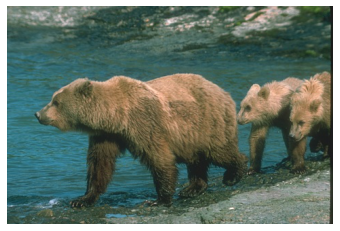

In [7]:
plt.axis('off');
plt.imshow(images[0]);

Num of Clusters: 18


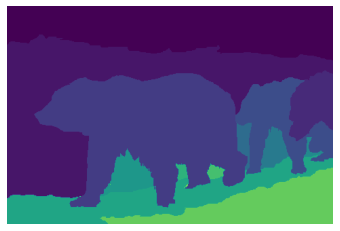

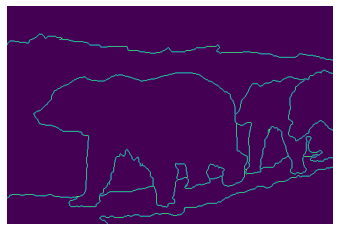

Num of Clusters: 5


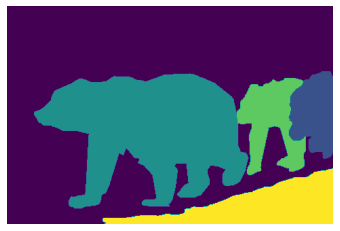

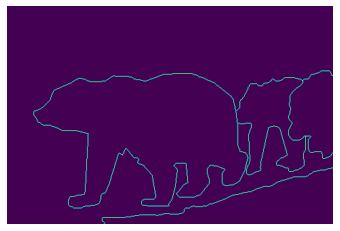

Num of Clusters: 13


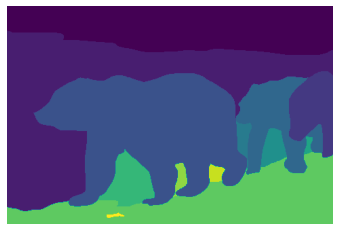

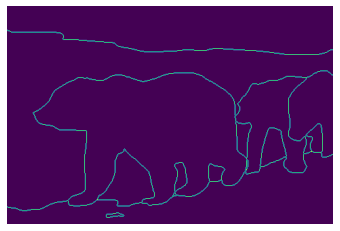

Num of Clusters: 16


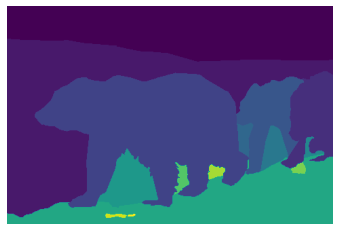

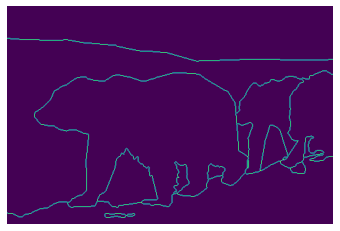

Num of Clusters: 30


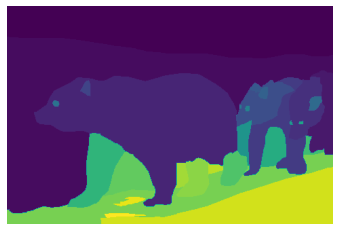

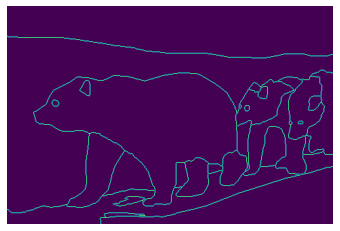

Num of Clusters: 16


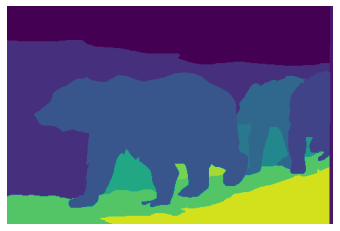

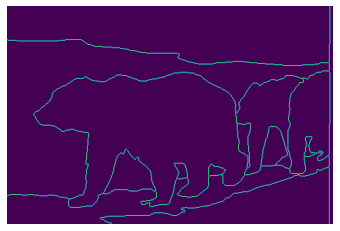

In [8]:
for i in range(truths[0]['groundTruth'][0].shape[0]):
  print("Num of Clusters: " + str(max(map(max, truths[0]['groundTruth'][0][i][0][0][0]))))
  for j in range(2):
    plt.axis('off');
    plt.imshow(truths[0]['groundTruth'][0][i][0][0][j])
    plt.show()
  

## Segmentation using K-Means

In [9]:
def CIELabDelta(data, centeroid):
  color1_rgb = sRGBColor(data[0], data[1], data[2]);
  color2_rgb = sRGBColor(centeroid[0], centeroid[1], centeroid[2]);

  color1_lab = convert_color(color1_rgb, LabColor);
  color2_lab = convert_color(color2_rgb, LabColor);
  delta_e = delta_e_cie2000(color1_lab, color2_lab);
  return delta_e

In [10]:
def Kmeans(data, num_clusters = 2, tolerance=0.0001, max_iter = 300, CIELAB = False):
    iter_num = 0
    n = data.shape[0] # 154401
    c = data.shape[1] # 3

    mean = np.mean(data, axis = 0) # 154401
    std = np.std(data, axis = 0)
    centroids = np.random.randn(num_clusters,c)*std + mean # 2 x 3
        
    old_centroids = np.zeros(centroids.shape)  # 2 x 3
    new_centroids = deepcopy(centroids)  # 2 x 3
    error = np.linalg.norm(new_centroids - old_centroids)
    clusters = np.zeros(n) # 154401
    distances = np.zeros((n,num_clusters)) # 154401 x 2
    while error > tolerance and iter_num < max_iter:
        iter_num += 1
        for i in range(num_clusters):
            distances[:,i] = np.linalg.norm(data - new_centroids[i], axis=1)
        clusters = np.argmin(distances, axis = 1)
        old_centroids = deepcopy(new_centroids)
        for i in range(num_clusters):
            if not data[clusters == i].any():
                new_centroids[i] = np.random.randn(1,c)*std + mean
                continue
            new_centroids[i] = np.mean(data[clusters == i], axis=0)
        error = np.linalg.norm(new_centroids - old_centroids)
        if iter_num == 2 :
          break
        
    return new_centroids,clusters,error,iter_num

In [11]:
def colorImage(image, clusters, num_clusters):
  colors = [np.array([68,1,84]), np.array([56,86,139]), np.array([83,197,103]), np.array([210,225,27]), np.array([48,103,141])]
  # colors = []
  for i in range(len(colors),num_clusters):
    colors.append(np.array([randint(0, 255),randint(0, 255),randint(0, 255)]))
  for i in range(len(clusters)):
      image[i] = colors[clusters[i]]
  # plt.imshow(image.reshape(321,481,3).astype('uint8'))
  # plt.figure()
  return image.reshape(321,481,3).astype('uint8')


In [12]:
flat = np.zeros(154401*3*200).reshape(200,154401,3)
for i in range(len(images)):
  flat[i] = images[i].flatten().reshape(-1,3)


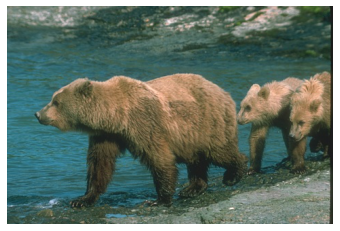

In [13]:
plt.axis('off');
plt.imshow(flat[0].reshape(321,481,3).astype('uint8'))

In [48]:
K = [3,5,7,9,11]
clustered_images = []
clustered_colored_images = []
image_nums = []
for i in range(0,25,5):
  image_nums.append(i)
  for k in K:
    centers, clusters, err, itr = Kmeans(flat[i], num_clusters = k)
    clustered_images.append(clusters)
    clustered_colored_images.append(colorImage(deepcopy(flat[i]), clusters, k))
    # print(f"Clusters at K = {k}")    
    # print(Counter(clusters))
    # plt.imshow(images[i])
    # plt.show()

## Big Picture

### Select 5 Images

Original Image


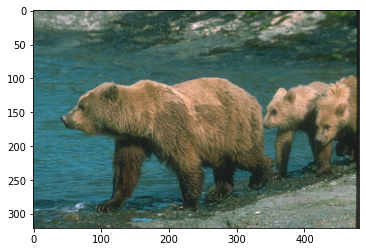

Clusters at K = 3
Counter({0: 101064, 1: 35257, 2: 18080})


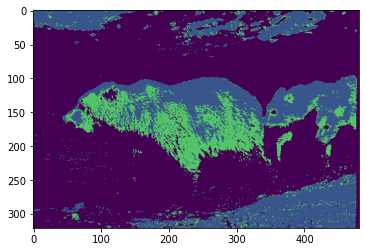

Clusters at K = 5
Counter({4: 45711, 0: 39389, 1: 29321, 2: 25169, 3: 14811})


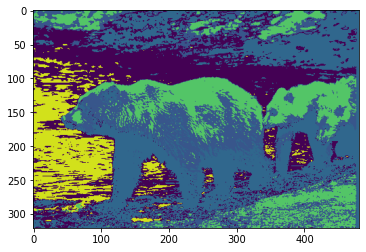

Clusters at K = 7
Counter({5: 49607, 1: 28394, 2: 26134, 0: 17674, 3: 16210, 6: 9295, 4: 7087})


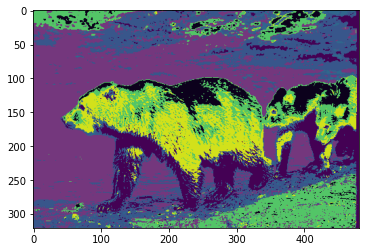

Clusters at K = 9
Counter({3: 31303, 2: 31237, 1: 23582, 8: 22680, 6: 13882, 5: 12401, 4: 11322, 0: 6401, 7: 1593})


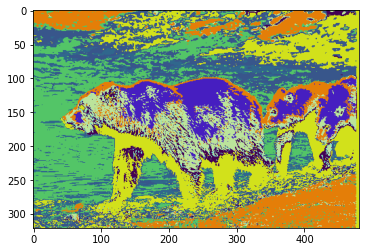

Clusters at K = 11
Counter({10: 35458, 1: 24511, 2: 14339, 9: 13392, 4: 12627, 0: 11233, 5: 10631, 8: 8985, 6: 8709, 3: 8141, 7: 6375})


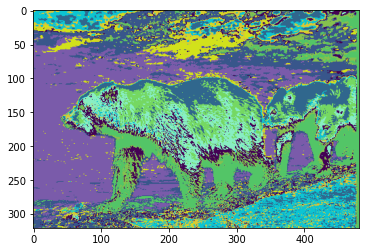

Ground Truth
Num of Clusters: 18


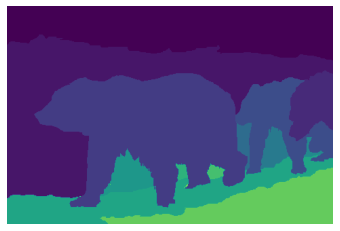

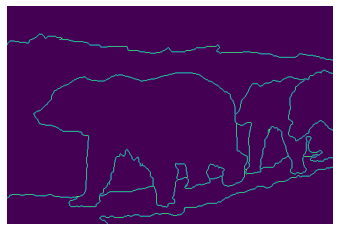

Num of Clusters: 5


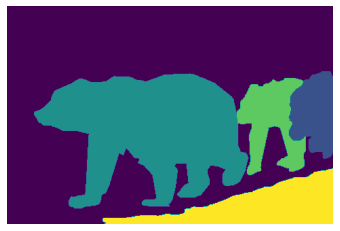

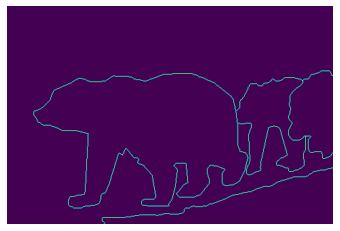

Num of Clusters: 13


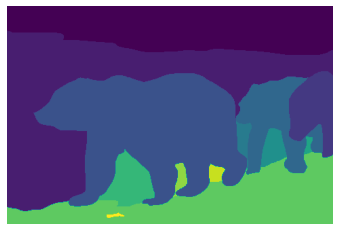

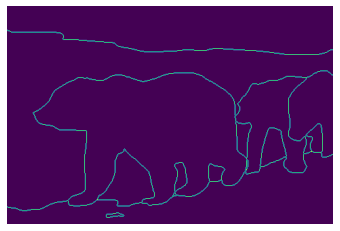

Num of Clusters: 16


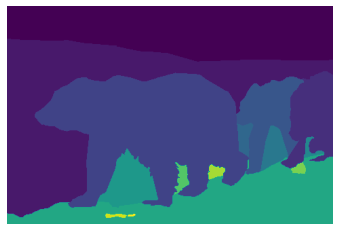

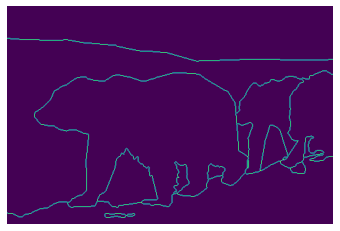

Num of Clusters: 30


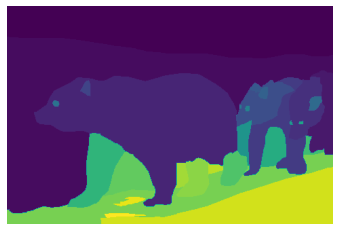

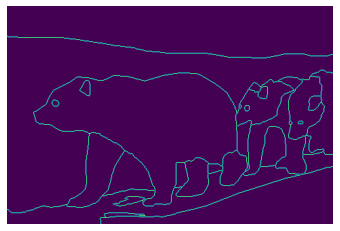

Num of Clusters: 16


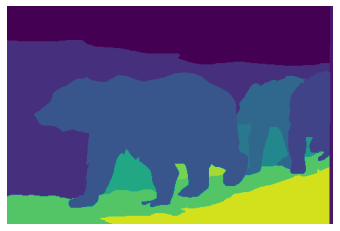

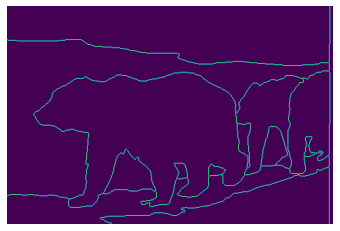

In [49]:
count = 0
print("Original Image")
plt.imshow(images[image_nums[0]])
plt.show()

for k in K:
  print(f"Clusters at K = {k}")
  print(Counter(clustered_images[count]))
  plt.imshow(clustered_colored_images[count])
  plt.show()
  count += 1

print("Ground Truth")
for i in range(truths[image_nums[0]]['groundTruth'][0].shape[0]):
  print("Num of Clusters: " + str(max(map(max, truths[0]['groundTruth'][0][i][0][0][0]))))
  for j in range(2):
    plt.axis('off');
    plt.imshow(truths[image_nums[0]]['groundTruth'][0][i][0][0][j])
    plt.show()

Original Image


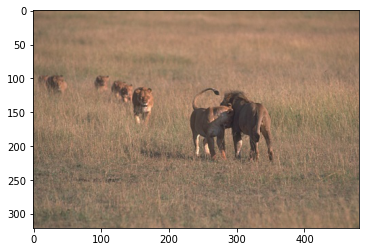

Clusters at K = 3
Counter({1: 74567, 2: 53248, 0: 26586})


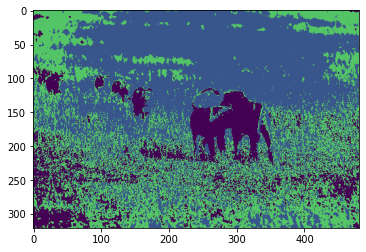

Clusters at K = 5
Counter({1: 72190, 0: 37084, 2: 31877, 3: 9812, 4: 3438})


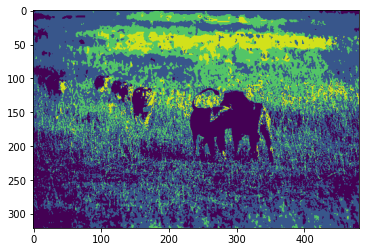

Clusters at K = 6
Counter({5: 42460, 3: 41971, 0: 37390, 2: 21183, 4: 8435, 1: 2962})


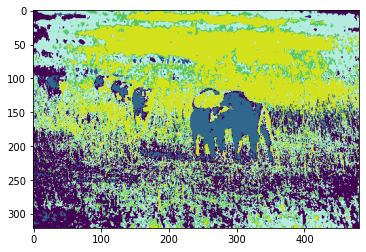

Clusters at K = 7
Counter({2: 55977, 5: 49061, 1: 27637, 3: 7928, 6: 7699, 4: 5661, 0: 438})


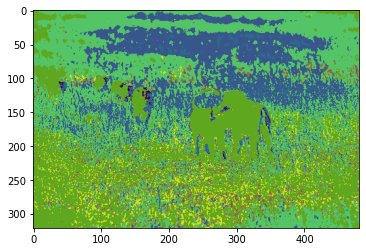

Clusters at K = 9
Counter({1: 48166, 7: 38543, 4: 19041, 8: 13987, 3: 12362, 6: 11662, 2: 5204, 0: 4109, 5: 1327})


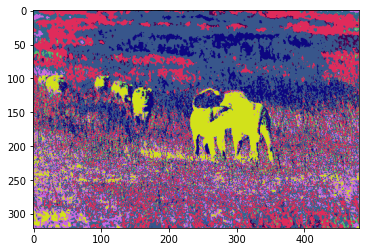

Ground Truth
Num of Clusters: 18


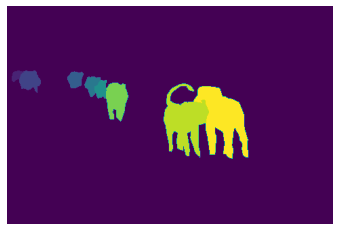

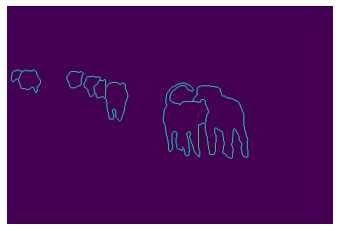

Num of Clusters: 5


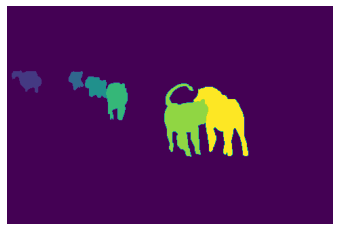

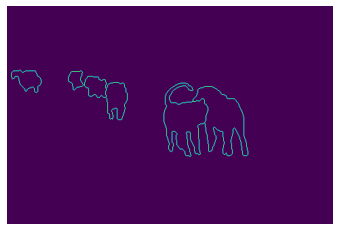

Num of Clusters: 13


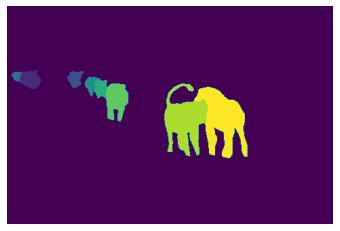

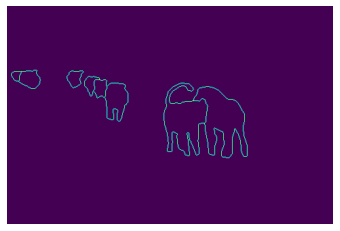

Num of Clusters: 16


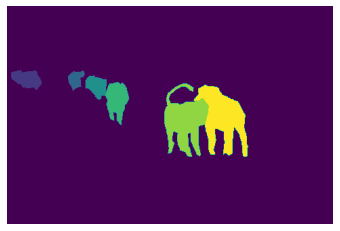

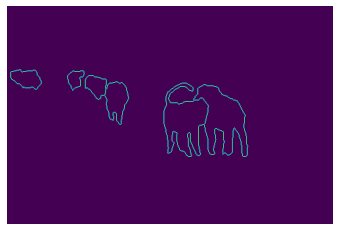

Num of Clusters: 30


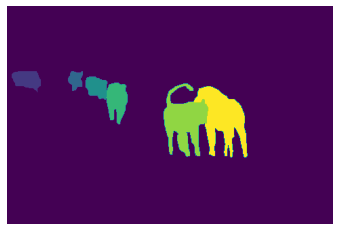

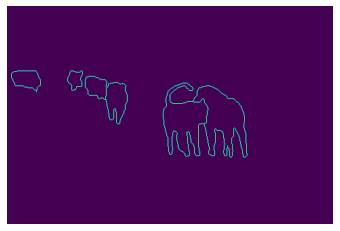

Num of Clusters: 16


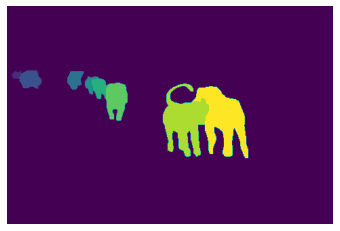

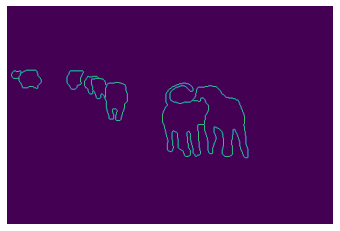

In [ ]:
print("Original Image")
plt.imshow(images[image_nums[1]])
plt.show()

count = 5
for k in K:
  print(f"Clusters at K = {k}")
  print(Counter(clustered_images[count]))
  plt.imshow(clustered_colored_images[count])
  plt.show()
  count += 1

print("Ground Truth")
for i in range(truths[image_nums[1]]['groundTruth'][0].shape[0]):
  print("Num of Clusters: " + str(max(map(max, truths[0]['groundTruth'][0][i][0][0][0]))))
  for j in range(2):
    plt.axis('off');
    plt.imshow(truths[image_nums[1]]['groundTruth'][0][i][0][0][j])
    plt.show()

Original Image


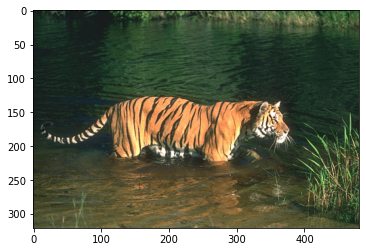

Clusters at K = 3
Counter({0: 65127, 2: 61578, 1: 27696})


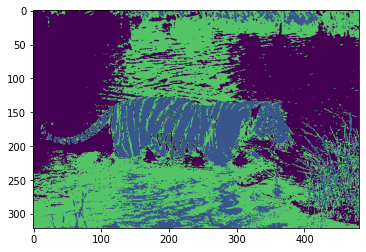

Clusters at K = 5
Counter({4: 76022, 1: 38648, 2: 25759, 0: 12435, 3: 1537})


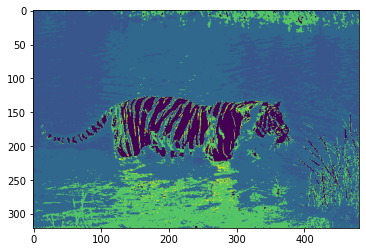

Clusters at K = 6
Counter({2: 53984, 4: 49092, 3: 21283, 5: 16090, 1: 13815, 0: 137})


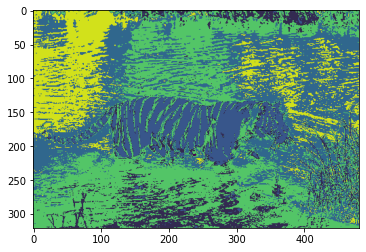

Clusters at K = 7
Counter({6: 46253, 0: 40948, 1: 24210, 3: 19397, 2: 16500, 5: 6201, 4: 892})


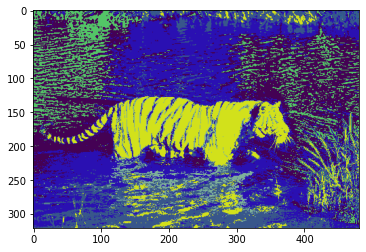

Clusters at K = 9
Counter({7: 47808, 4: 36814, 1: 25433, 3: 25002, 5: 15102, 8: 2646, 6: 1140, 2: 443, 0: 13})


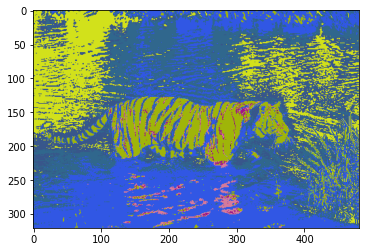

Ground Truth
Num of Clusters: 18


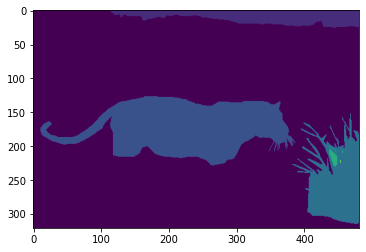

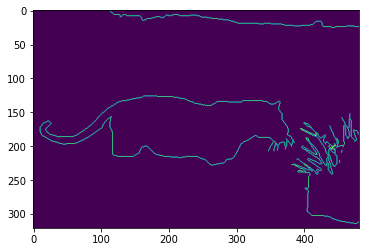

Num of Clusters: 5


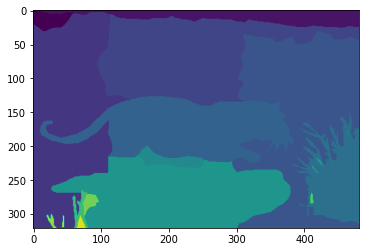

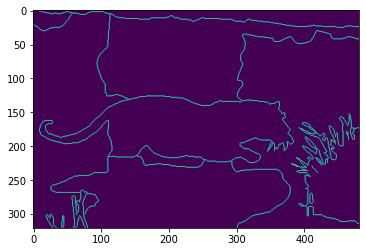

Num of Clusters: 13


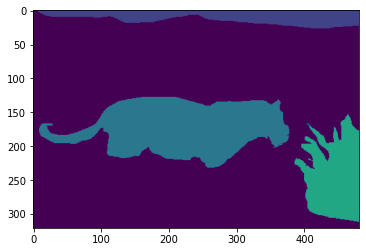

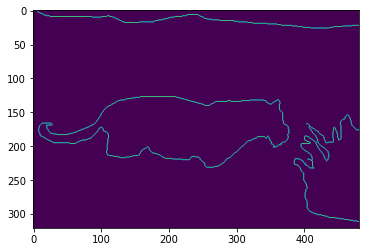

Num of Clusters: 16


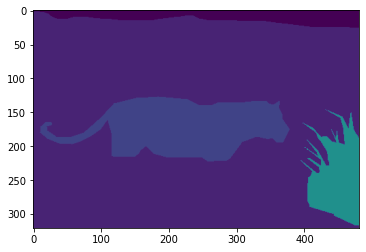

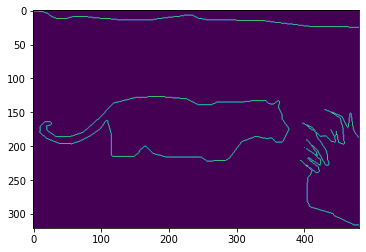

Num of Clusters: 30


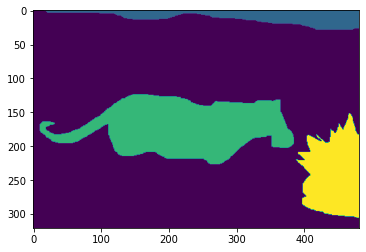

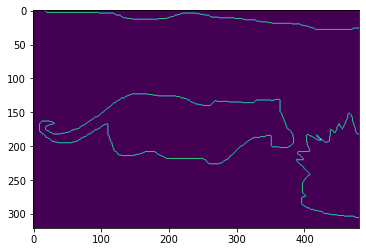

In [ ]:
print("Original Image")
plt.imshow(images[image_nums[2]])
plt.show()

count = 10
for k in K:
  print(f"Clusters at K = {k}")
  print(Counter(clustered_images[count]))
  plt.imshow(clustered_colored_images[count])
  plt.show()
  count += 1

print("Ground Truth")
for i in range(truths[image_nums[2]]['groundTruth'][0].shape[0]):
  print("Num of Clusters: " + str(max(map(max, truths[0]['groundTruth'][0][i][0][0][0]))))
  for j in range(2):
    plt.imshow(truths[image_nums[2]]['groundTruth'][0][i][0][0][j])
    plt.show()

Original Image


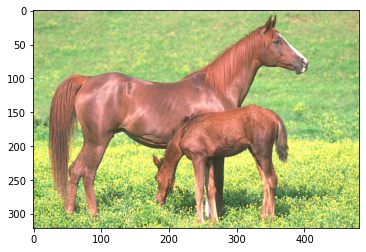

Clusters at K = 3
Counter({1: 75702, 0: 42025, 2: 36674})


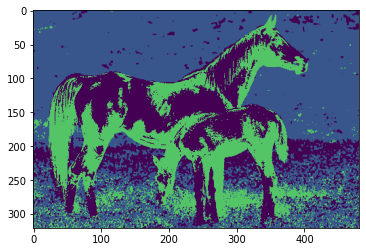

Clusters at K = 5
Counter({2: 44656, 1: 38384, 4: 31832, 3: 20701, 0: 18828})


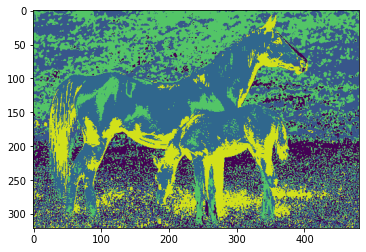

Clusters at K = 6
Counter({2: 48615, 5: 36001, 1: 25548, 0: 24296, 4: 11546, 3: 8395})


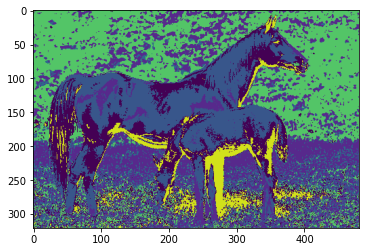

Clusters at K = 7
Counter({6: 76380, 3: 24013, 5: 23889, 4: 13382, 0: 8112, 1: 5467, 2: 3158})


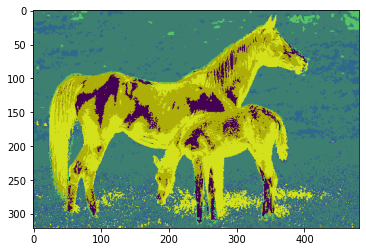

Clusters at K = 9
Counter({0: 39625, 6: 21458, 7: 20562, 8: 16801, 4: 16299, 3: 14721, 1: 13957, 5: 10904, 2: 74})


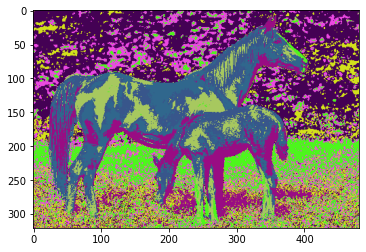

Ground Truth
Num of Clusters: 18


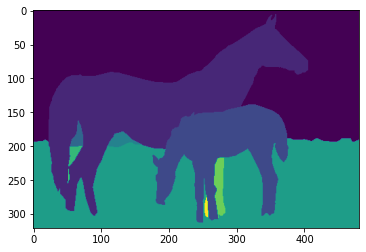

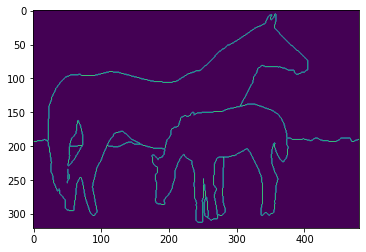

Num of Clusters: 5


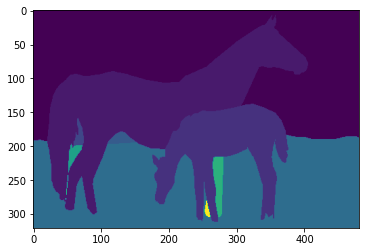

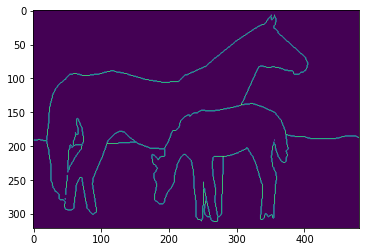

Num of Clusters: 13


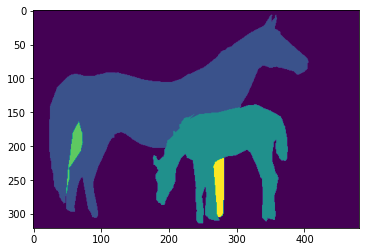

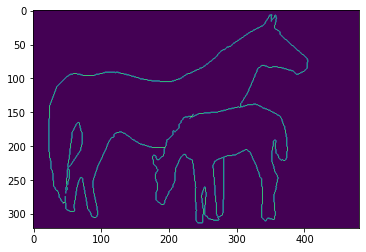

Num of Clusters: 16


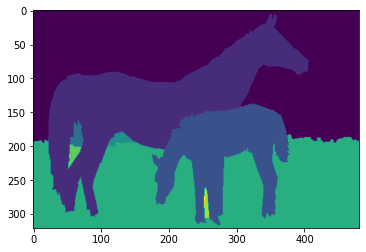

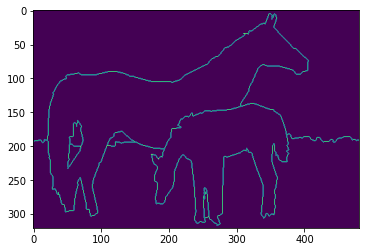

Num of Clusters: 30


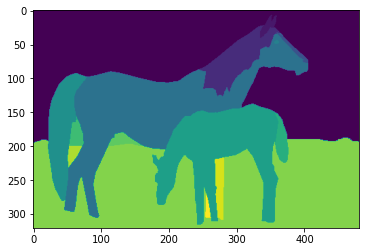

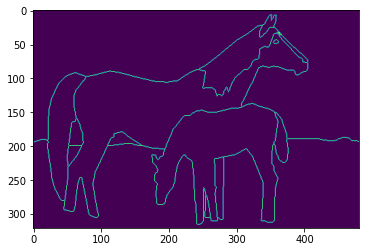

Num of Clusters: 16


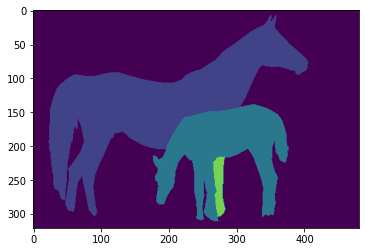

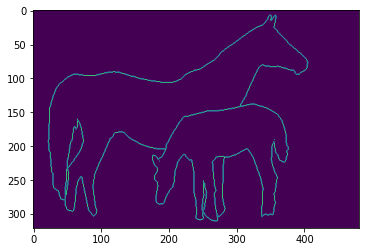

In [ ]:
print("Original Image")
plt.imshow(images[image_nums[3]])
plt.show()

count = 15
for k in K:
  print(f"Clusters at K = {k}")
  print(Counter(clustered_images[count]))
  plt.imshow(clustered_colored_images[count])
  plt.show()
  count += 1

print("Ground Truth")
for i in range(truths[image_nums[3]]['groundTruth'][0].shape[0]):
  print("Num of Clusters: " + str(max(map(max, truths[0]['groundTruth'][0][i][0][0][0]))))
  for j in range(2):
    plt.imshow(truths[image_nums[3]]['groundTruth'][0][i][0][0][j])
    plt.show()

Original Image


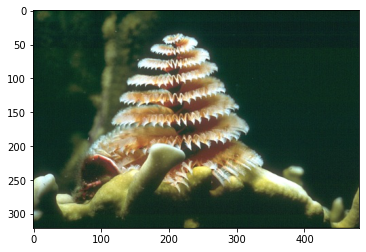

Clusters at K = 3
Counter({0: 134161, 2: 20240})


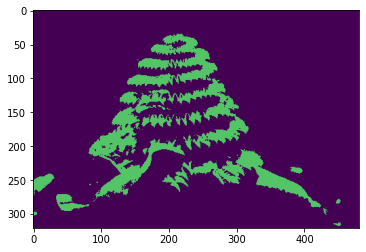

Clusters at K = 5
Counter({2: 93013, 0: 19821, 1: 17627, 4: 13049, 3: 10891})


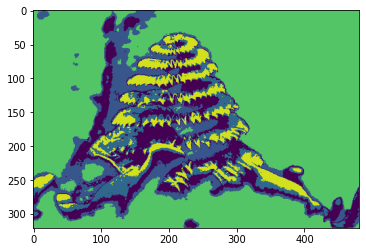

Clusters at K = 6
Counter({0: 90727, 4: 17694, 3: 16165, 1: 12758, 5: 10661, 2: 6396})


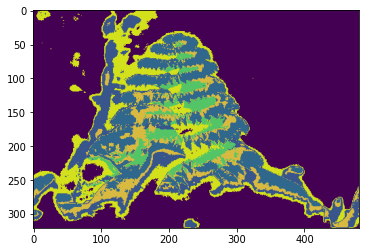

Clusters at K = 7
Counter({0: 104665, 5: 21162, 4: 11872, 3: 7312, 1: 6531, 6: 2859})


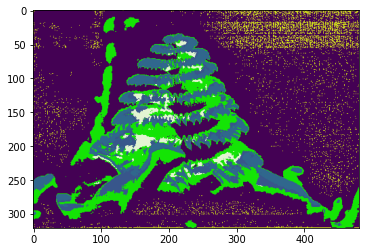

Clusters at K = 9
Counter({8: 88218, 7: 16560, 5: 14900, 1: 12412, 4: 11962, 6: 9953, 3: 396})


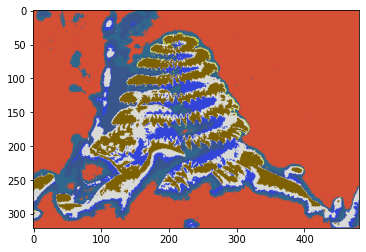

Ground Truth
Num of Clusters: 18


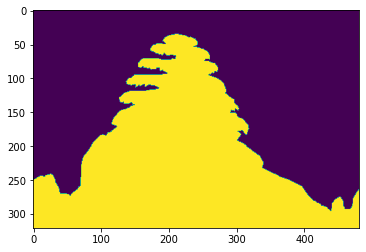

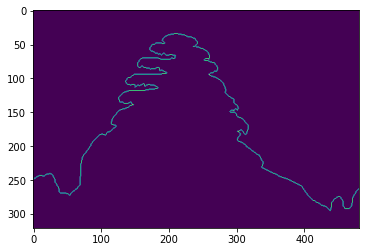

Num of Clusters: 5


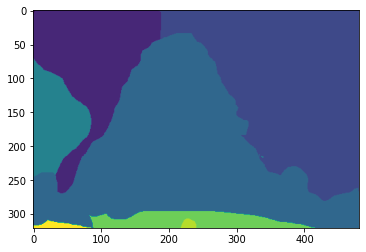

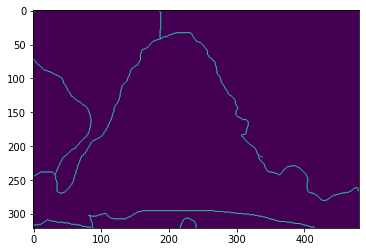

Num of Clusters: 13


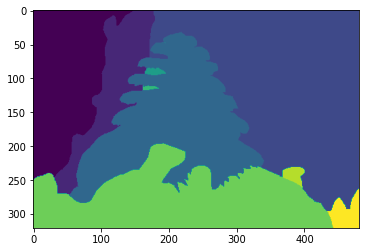

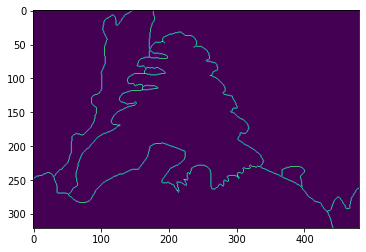

Num of Clusters: 16


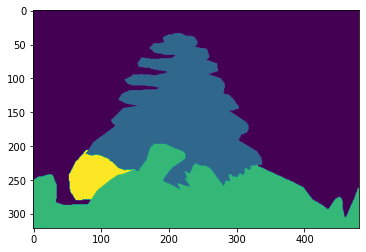

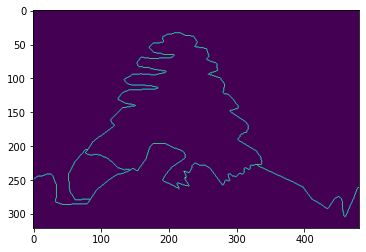

Num of Clusters: 30


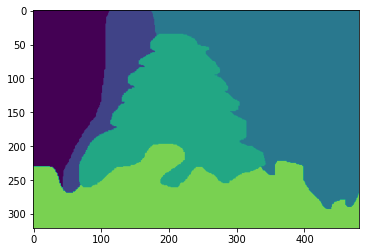

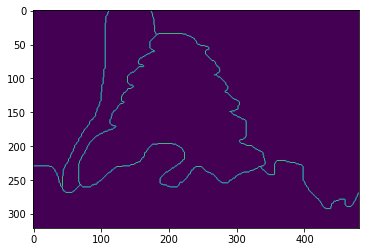

In [ ]:
print("Original Image")
plt.imshow(images[image_nums[4]])
plt.show()

count = 20
for k in K:
  print(f"Clusters at K = {k}")
  print(Counter(clustered_images[count]))
  plt.imshow(clustered_colored_images[count])
  plt.show()
  count += 1

print("Ground Truth")
for i in range(truths[image_nums[4]]['groundTruth'][0].shape[0]):
  print("Num of Clusters: " + str(max(map(max, truths[0]['groundTruth'][0][i][0][0][0]))))
  for j in range(2):
    plt.imshow(truths[image_nums[4]]['groundTruth'][0][i][0][0][j])
    plt.show()

### Normalized Cut
* Select the same five images and display their corresponding ground 
truth against your segmentation results using Normalized-cut for the 
5-NN graph, at K=5. Comment on the results.

* Select the same five images and contrast your segmentation results 
using Normalized-cut for the 5-NN graph, at K=5 versus using Kmeans at K=5. Comment on the results

In [ ]:
import cv2
from sklearn.cluster import KMeans

def normalizedCut(img,num_clusters):
  img = img.reshape(321,481,3)
  img = cv2.resize(img,(100,100))
  img = np.array(img)
  img = img.reshape(-1,3)
  sim_mat = rbf(img)

  d = np.sum(sim_mat,axis =1)
  d = np.diag(d)
  L = d - sim_mat
  La = np.dot(np.linalg.inv(d),L)

  eigen_values,eigen_vectors = np.linalg.eig(La)
  eigen_values = np.real(eigen_values)
  eigen_vectors = np.real(eigen_vectors)
  idx = eigen_values.argsort()
  eigen_values = eigen_values[idx]
  eigen_vectors = eigen_vectors[:,idx]

  U = eigen_vectors[:,:150]
  Y = np.zeros(U.shape)
  norms = np.linalg.norm(U,axis = 1)
  for row in range(100*100):
    Y[row] = U[row] / norms[row]

  clusters = KMeans(5).fit_predict(Y)
  result = clusters.reshape((100,100))
  return result

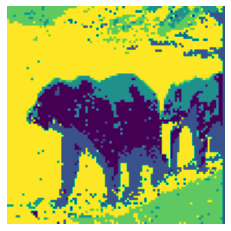

In [ ]:
# n_cut_results = []
# for i in range(0,5):
res = normalizedCut(flat[image_nums[0]],5)
n_cut_results.append(res)
plt.imshow(res);
plt.axis('off');
plt.show()

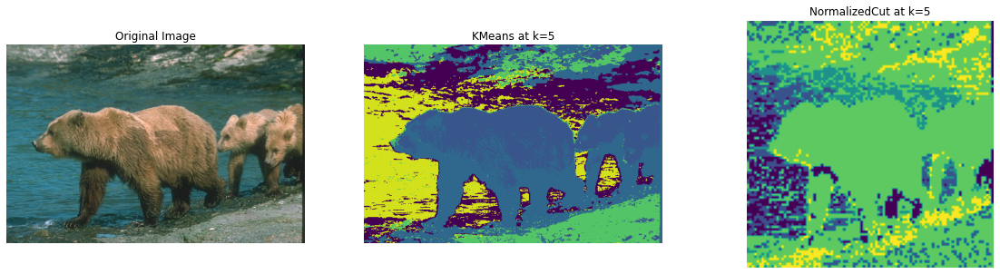

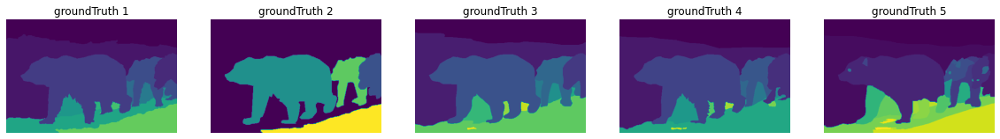

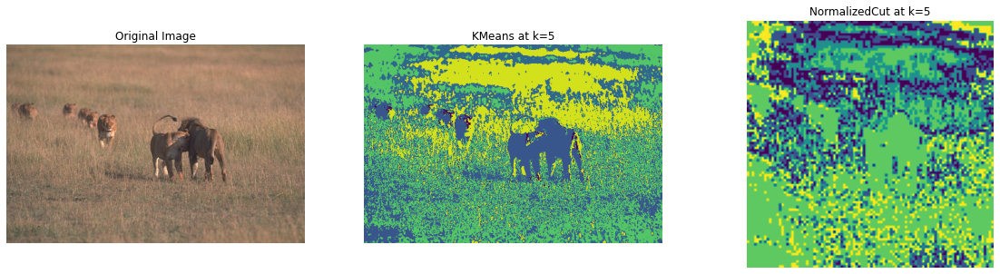

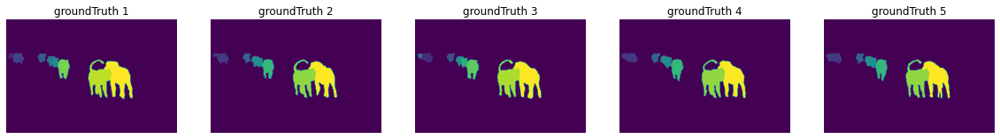

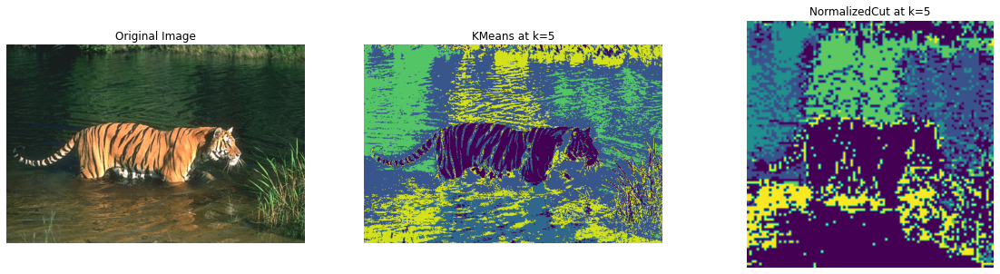

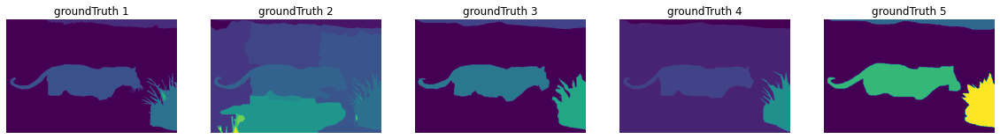

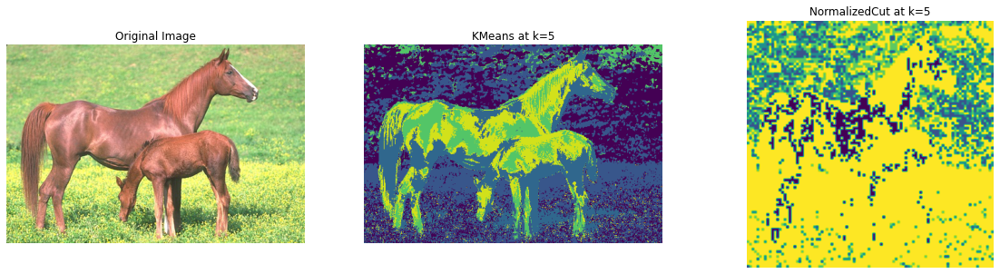

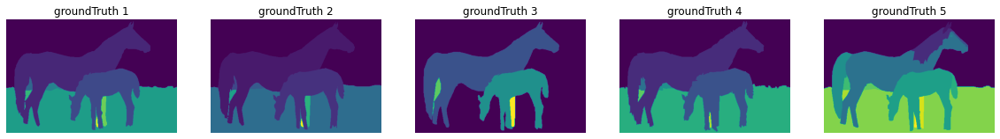

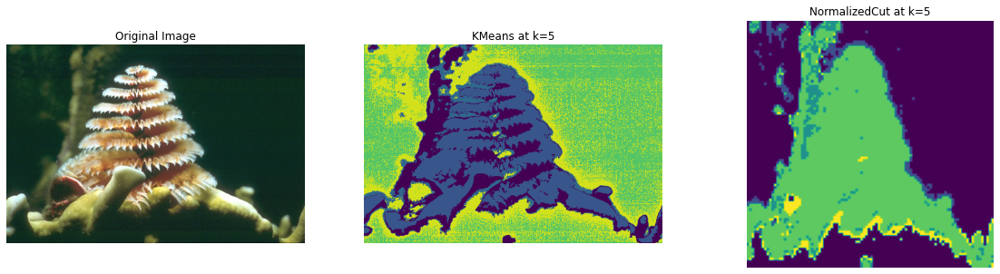

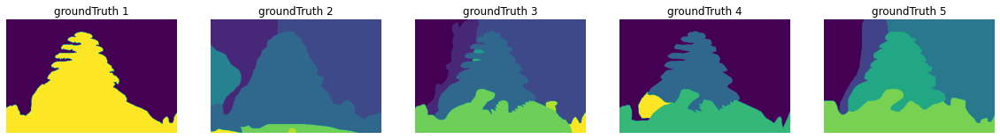

In [ ]:
for i in range(5):
  fig, axs = plt.subplots(1,3, figsize=(20,5))
  fig, axs2 = plt.subplots(1,5, figsize=(20,5))
  axs[0].axis('off')
  axs[0].imshow(images[image_nums[i]])
  axs[0].set_title("Original Image")
  axs[1].axis('off')
  axs[1].imshow(clustered_colored_images[(i*5)+1])
  axs[1].set_title("KMeans at k=5")
  axs[2].axis('off')
  axs[2].imshow(n_cut_results[i])
  axs[2].set_title("NormalizedCut at k=5")
  for j in range(0, 5) :
    axs2[j].axis('off')
    axs2[j].imshow(truths[image_nums[i]]['groundTruth'][0][j][0][0][0])
    axs2[j].set_title("groundTruth "+ str(j+1))

## Spatial Layout


*   In the previous parts, we used the color features RGB. We did not encode the layout of the pixels. We want to modify that for K-means clustering to encode the spatial layout of the pixels.
*   Modify the feature vector to include spatial layout.



In [119]:
image_xy = []
images_xy = []
for img_num in range(0,25,5):
  image_xy = []
  for i in range(images[img_num].shape[0]):
    pixel_row = []
    for j in range(images[img_num].shape[1]):
      pixel = [i//15, j//15, images[img_num][i][j][0], images[img_num][i][j][1], images[img_num][i][j][2]]
      pixel_row.append(pixel)
    image_xy.append(pixel_row)
  images_xy.append(image_xy)
images_xy = np.array(images_xy)

In [120]:
flat_xy = np.zeros(154401*5*5).reshape(5,154401,5)
for i in range(5):
  flat_xy[i] = images_xy[i].flatten().reshape(-1,5)

In [121]:
K = [3,5,7,9,11]
clustered_images_xy = []
clustered_colored_image_xy = []
clustered_colored_images_xy = []

for i in range(5):
  # image_nums.append(i)
  clustered_colored_image_xy = []
  for k in K:
    centers, clusters, err, itr = Kmeans(flat_xy[i], num_clusters = k)
    clustered_images_xy.append(clusters)
    clustered_colored_image_xy.append(colorImage(deepcopy(flat[i*5]), clusters, k))
  clustered_colored_images_xy.append(clustered_colored_image_xy)

In [122]:
clustered_without_spatial = []
for i in range(0, 25, 5):
  clustered_without_spatial.append(clustered_colored_images[i:i+5])

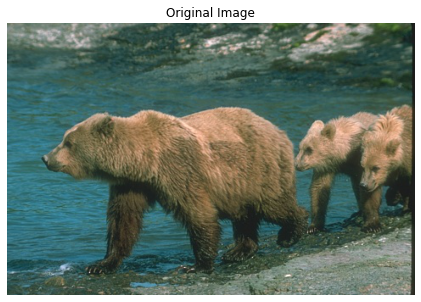

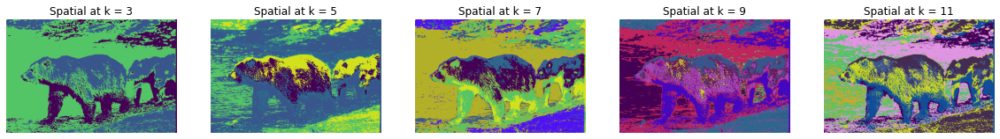

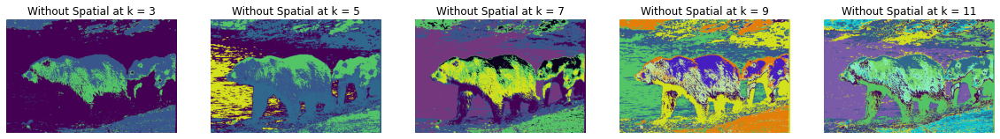

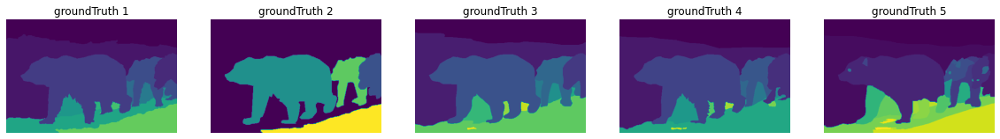

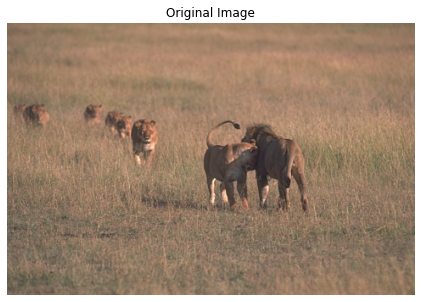

...

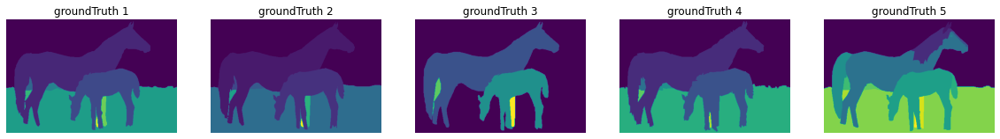

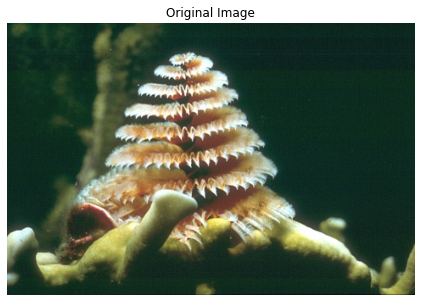

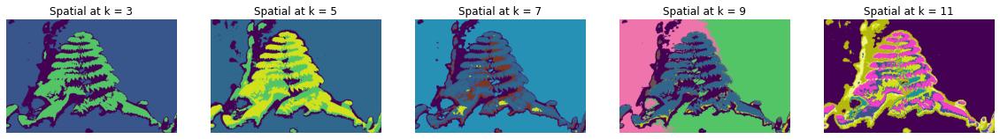

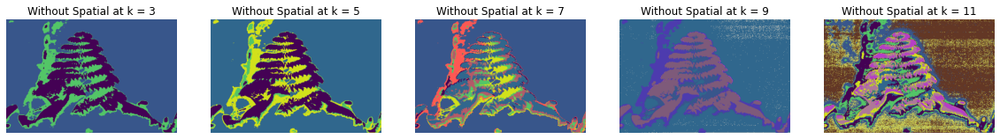

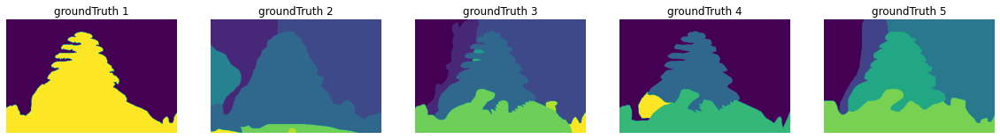

In [123]:
for i in range(5):
  fig, axs = plt.subplots(figsize=(20,5))
  axs.axis('off')
  axs.imshow(images[i*5])
  axs.set_title("Original Image")

  fig, axs1 = plt.subplots(1,5, figsize=(20,5))
  fig, axs2 = plt.subplots(1,5, figsize=(20,5))
  fig, axs3 = plt.subplots(1,5, figsize=(20,5))


  for j in range(5):
    axs1[j].axis('off')
    axs1[j].imshow(clustered_colored_images_xy[i][j])
    axs1[j].set_title(f"Spatial at k = {(j*2+3)}")

  for j in range(5):
    axs2[j].axis('off')
    axs2[j].imshow(clustered_without_spatial[i][j])
    axs2[j].set_title(f"Without Spatial at k = {(j*2+3)}")

  for j in range(0, 5) :
    axs3[j].axis('off')
    axs3[j].imshow(truths[i*5]['groundTruth'][0][j][0][0][0])
    axs3[j].set_title("groundTruth "+ str(j+1))